# 🐕 End-to-End Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The Data we are using is from kaggle's competition named: **Dog Breed Identification**
https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation

The evaluation is a file with prediction probabilities with each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images (**Unstructured data**) so it's probably best we use Deep Learning / Transfer Learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the test set  (these images have no labels because we will want to predict them.)

In [ ]:
# Upload and unzip the folder into the drive!
#!unzip "drive/MyDrive/Colab projects/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Colab projects/Dog Vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Colab projects/Dog Vision/train/83fbbcc9

## Getting the Workspace ready!

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.17.0
Hub version: 0.16.1
GPU not available :(


### Getting our data read (turning it into Tensors)

with all the machine learning models, our data has to be in a numerical format. Turning our images into Tensors(numerical representations) is our first step in preprocessing data.

let's start by accessing our data and check out the labels.

In [ ]:
#Check out the labels of the data
import pandas as pd
labels = pd.read_csv("drive/MyDrive/Colab projects/Dog Vision/labels.csv")
print(labels.describe())
print(labels.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

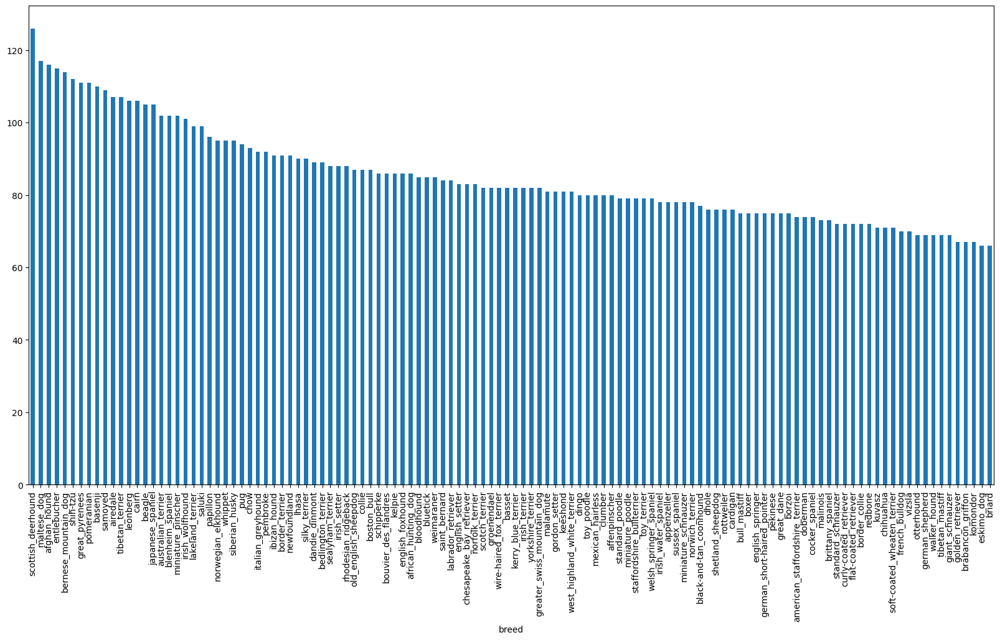

In [ ]:
# How many images are there of each breed?
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels["breed"].value_counts().median()

82.0

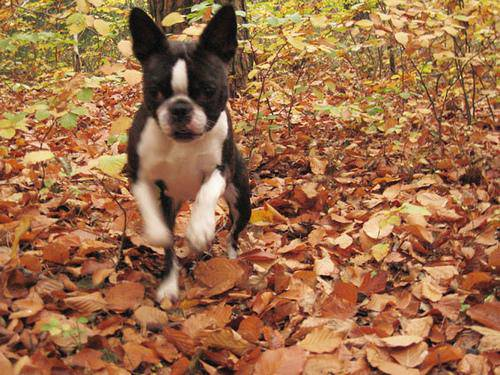

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab projects/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


### Getting images and their labels

let's get a list of all their files and path names.

In [ ]:
# Create pathnames from Image ID's
filenames = ["drive/MyDrive/Colab projects/Dog Vision/train/" + fname + ".jpg" for fname in labels["id"]]

# check the first 10
filenames[:10]

['drive/MyDrive/Colab projects/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Colab projects/Dog Vision/train/")[:10]

['aed2415f3d996819d68ea82acaca4654.jpg',
 'af25571106623e3c34d260cda4bd3096.jpg',
 'aa94045f0221be29ee6508361b4913fc.jpg',
 'aac57b0a7685289a66eb1fac7ec2ed2d.jpg',
 'ae379664238894ccaaaa789b988b9b4e.jpg',
 'addf2f5e7426173ffb795fa485edae63.jpg',
 'a9054d27b758b05eac6e483eba0f9f78.jpg',
 'b12ca57dbc800fd7caf1327516b4fa1b.jpg',
 'aef0d510ecb238da32b77e26da8ff327.jpg',
 'a9cc695bcbdf1b0ae3784149fcffd8ff.jpg']

Since our data was not properly unzipped, therefore i managed to write this out with the help of researching.

In [ ]:
import os
import pandas as pd

# Load the CSV labels file
labels = pd.read_csv("drive/MyDrive/Colab projects/Dog Vision/labels.csv")

# Create filenames from Image IDs in the CSV
filenames = ["drive/MyDrive/Colab projects/Dog Vision/train/" + fname + ".jpg" for fname in labels["id"]]

# Get the list of actual image files from the directory
actual_files = os.listdir("drive/MyDrive/Colab projects/Dog Vision/train/")

# Remove file extensions to compare with CSV ids
actual_files = [os.path.splitext(file)[0] for file in actual_files]

# Check for missing files by comparing actual files with filenames
missing_files = set(labels["id"]) - set(actual_files)
extra_files = set(actual_files) - set(labels["id"])

# Print the result
if len(missing_files) == 0 and len(extra_files) == 0:
    print("Filenames match the actual number of files!")
else:
    if len(missing_files) > 0:
        print(f"Missing files: {missing_files}")
    if len(extra_files) > 0:
        print(f"Extra files in the directory not present in labels.csv: {extra_files}")

# Optionally: Filter out rows from labels where the file is missing
if len(missing_files) > 0:
    filtered_labels = labels[~labels["id"].isin(missing_files)]
    print(f"Filtered labels now have {len(filtered_labels)} entries, compared to {len(labels)} before.")

    # Save the filtered labels if needed
    filtered_labels.to_csv("drive/MyDrive/Colab projects/Dog Vision/filtered_labels.csv", index=False)
    print("Filtered labels saved.")


Missing files: {'f3b47556eea0151354f1ee1b40762fce', 'd8611e2c4409411ea1cea007e2c456ce', 'ca8e824e2e6fd1321271321ea5034fe7', 'f6bdbf94ffea753f4f7638784faf01cc', 'c59c717f3f699529820090cd02563faa', 'f7be7c1d6af9e654f16e6d74ea63a8a5', 'db7aa8aa2ec0ffecda4127bad65ceac4', 'f34628fdce6eb2c69ad9c65d0f44f2f7', 'e4fe0acc8e0372aae5d0b0817e70bdef', 'dc19a7f22b2f78763083633f21db6602', 'd110e189aff527674e08285e7ff86508', 'df4d0576d927992df06c9bb08bb9bac7', 'ddbc4983d977bc4e0f4e622da3dd747b', 'dac0943bf45a8f3f1a8f374cf72dc50e', 'ccd5d80be42329634437ae59df20bb02', 'f738d8472928f06c5a3743914ac5d458', 'e467353f2da5b49fc7a8e9835b22fe0e', 'ca5fd2cb1f6e028918fc570cf74f539c', 'e5fb57e9d1239cd72c7855be2947b0c9', 'e06564ae7d0a60d41052c61076014a95', 'f74471ba376e55adf638f527eb794c2a', 'faa111bd776cdece79144aad36558eba', 'c97c9eb7d372827cb1b67b0a8afe8f83', 'd630a84482a95f1f4789b816c268ab1a', 'f0216b542b2feaf7fea3412ce949536e', 'd559926a39b741a19969b9e634ed1933', 'd5729b46847e1ccef0f318395b0975cd', 'f5091fcbb9e

In [ ]:
# Load the filtered labels file
filtered_labels = pd.read_csv("drive/MyDrive/Colab projects/Dog Vision/filtered_labels.csv")

# Create new pathnames from the filtered Image IDs
filtered_filenames = ["drive/MyDrive/Colab projects/Dog Vision/train/" + fname + ".jpg" for fname in filtered_labels["id"]]

# Check the first 10 filenames
filtered_filenames[:10]


['drive/MyDrive/Colab projects/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether the number of filenames matches the number of actual image files
if len(os.listdir("drive/MyDrive/Colab projects/Dog Vision/train/")) == len(filtered_filenames):
    print("Filenames match the actual amount of files!")
else:
    print("Filenames still do not match, investigate further.")


Filenames match the actual amount of files!


In [ ]:
# # Check whether number of filenames matches number of actual image files
# import os
# if len(os.listdir("drive/MyDrive/Colab projects/Dog Vision/train/")) == len(filenames):
#   print("Filenames match actual amount of files!")
# else:
#   print("Filenames do not match actual amount of files, check data!")

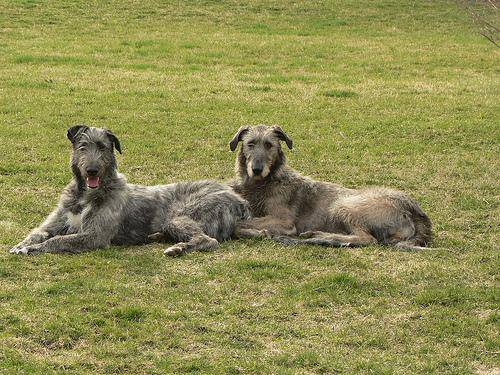

In [ ]:
# One more check
Image(filtered_filenames[7800])

In [ ]:
# Breed of the dog in above image
filtered_labels["breed"][7800]

'irish_wolfhound'

Since, we have got our training image filepaths in a list, let's prepare our filtered_labels.

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
import numpy as np
f_labels = filtered_labels["breed"].to_numpy()
#f_labels = np.array(f_labels) # does same thing above
f_labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'weimaraner',
       'greater_swiss_mountain_dog', 'kuvasz'], dtype=object)

In [ ]:
# See if the number of labels matches with number of filenames
if len(f_labels) == len(filtered_filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data!")

Number of labels matches number of filenames!


In [ ]:
unique_breeds = np.unique(f_labels)
len(unique_breeds)

120

In [ ]:
# Turn every single label into an array of booleans
print(f_labels[0])
f_labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every every single label into a boolean array
boolean_labels = [f_labels == unique_breeds for f_labels in f_labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

7890

In [ ]:
filtered_filenames[:10]

['drive/MyDrive/Colab projects/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from kaggle does'nt come with a validation set, we are going to create our own.

In [ ]:
# Setup X & y variables
X = filtered_filenames
y = boolean_labels

In [ ]:
len(X)

7890

we are going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a gaze at training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Colab projects/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab projects/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab projects/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab projects/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab projects/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fals

### Preprocessing Images

Turning images into tensors

To preprocess our images into tensors, we are going to write a function which does a few things:
1. Take an image filepath as input.
2. Use tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors.
4. Normalize our `image` (convert colour channels from `0-255` to  `0-1`)
5. Resize the `image` to be a shape of (224,224)
6. Return the Modified image

before we do, let's see what importing an image looks like.

In [ ]:
# Convert an image to a numpy array
from matplotlib.image import imread
image = imread(filtered_filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we have seen what an image looks like as tensor, Let's preprocess them by making a function.
1. Take an image filepath as input.
2. Use tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors.
4. Normalize our `image` (convert colour channels from `0-255` to  `0-1`)
5. Resize the `image` to be a shape of (224,224)
6. Return the Modified image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0 to 255 to 0 to 1 values.
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into Batches

let's say why turn our data into batches?

let's say you are trying to process 10.000+ images in one go, they all might not all fit in the memory....

SO that's why we do 32 images (`This is the batch size`) at a time,
(You can manaully adjust the batch size if need be)

In order to use Tensorflow effectively, we need our data in the form of tensorflow tuples which looks like this:
`(image, label)`.

In [ ]:
# create a simple function to return a tuple of tensors
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into a tuple of tensors in the form: `(image, label)`, let's make a function to turn all about data X & y into batches.

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is a valid dataset, we don't need to shuffle it.
  elif(valid_data):
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if none of these work
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling the pathnames and labels before mapping image processor function is a faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is in the form of batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(20,15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots 5 rows 5 coloumns
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # display an image
    #plt.imread(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

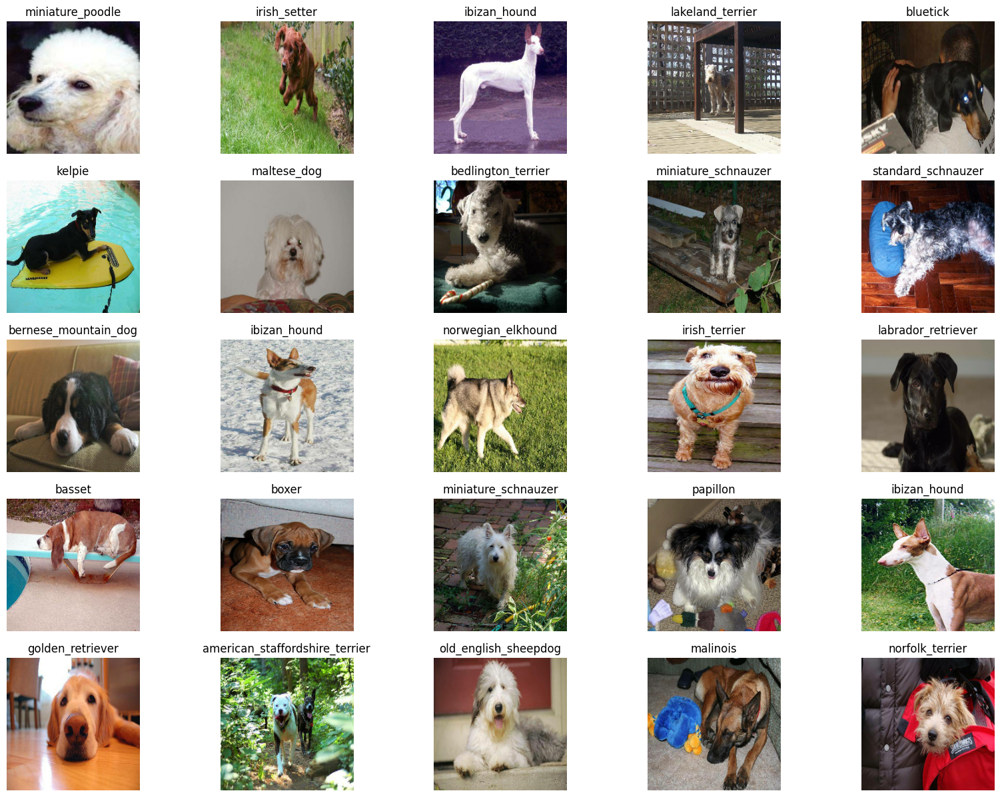

In [ ]:
# Now let's visualize the data in the training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

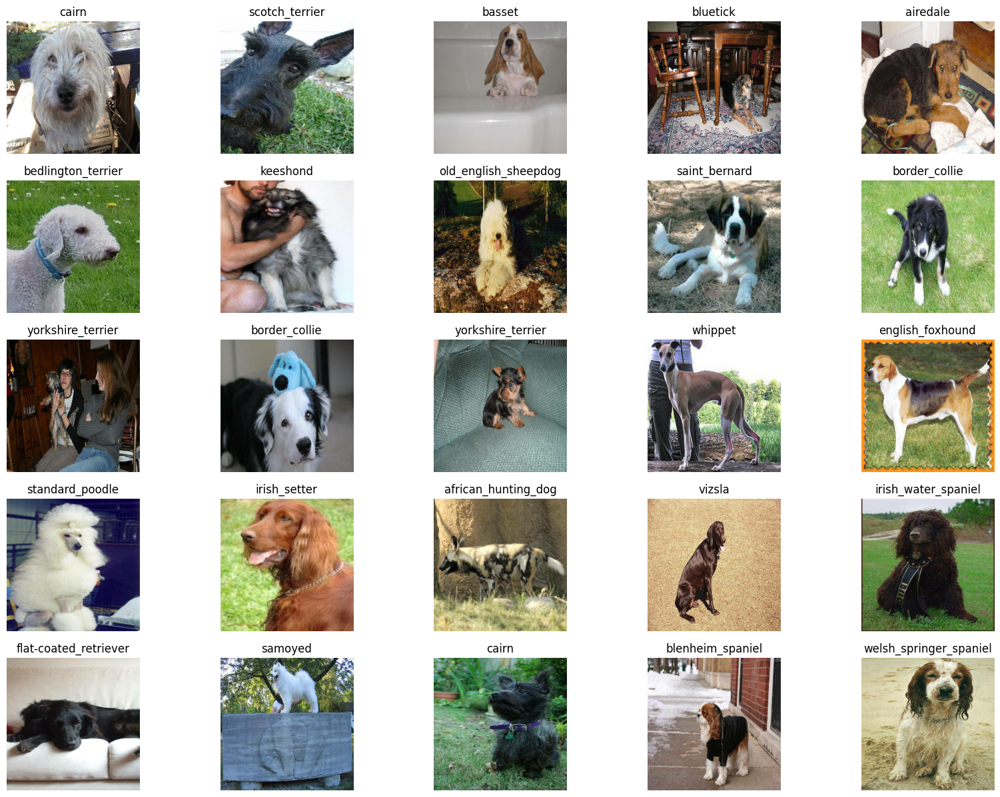

In [ ]:
# Now let's visualize for validation set,
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
 1. the input shape (our images shape, in the form of tensors) to our model.
 2. the output shape (image labels, in the form of tensors) of our model.
 3. The URL of the model we want to use from tensorflow hub.



In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3] # btach, height, witdh, color channels
# Setup the output shape to the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5"

now we have gout our inputs and outputs and model ready to go, let's put them together into a keras deep learning model.

knowing this let's create a function which:
1. Takes the input shape and output shape and the model we have chose as parameters
2. Defines the layers in the keras model in a sequential fashion.
3. Compiles the model (says it should be evaluated and imporved)
4. Builds the model (tells the model the input shape it will be getting)
5. Returns the model



In [ ]:
import tf_keras
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras .Sequential([
     tf_keras .layers.InputLayer(input_shape=INPUT_SHAPE), # input layer
    hub.KerasLayer(MODEL_URL),
    tf_keras .layers.Dense( units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras .losses.CategoricalCrossentropy(),
      optimizer=tf_keras .optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 6278745 (23.95 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 6158505 (23.49 MB)
_________________________________________________________________


## Creating callbacks

Callbakcks are helper functions our model can use during training to do such things as save it's progress, check it's progress or stop training early if a model stops improving and few more.

We will create 2 callbacks:

one for TensorBoard which helps tracks our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and
pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Colab projects/Dog Vision/logs",
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation stops imporving.

In [ ]:
# Create early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going train on 1000 images, to make sure the model is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function that trains a model.

1. Create a model using `create_model()`
2. Setup a tensorboard callback using `create_tensorboard_callback()`
3. Call the fit function on our model passing the training data, validataion data, number of epochs to train for `NUM_EPOCHS`
4. Return the model.

In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()
  # Create new TensorBoard
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing each of the three callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model # returns the fitted model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Epoch 1/100
25/25 [==============================] - 258s 10s/step - loss: 4.5991 - accuracy: 0.0862 - val_loss: 3.4622 - val_accuracy: 0.2000
Epoch 2/100
25/25 [==============================] - 73s 3s/step - loss: 1.6486 - accuracy: 0.6950 - val_loss: 2.1377 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 72s 3s/step - loss: 0.5655 - accuracy: 0.9388 - val_loss: 1.6484 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 71s 3s/step - loss: 0.2457 - accuracy: 0.9912 - val_loss: 1.4705 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 73s 3s/step - loss: 0.1435 - accuracy: 0.9962 - val_loss: 1.3799 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 74s 3s/step - loss: 0.0989 - accuracy: 1.0000 - val_loss: 1.3439 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] - 73s 3s

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

Note: Overfitting to begin with is a good thing. It means our model is learning something.

### Checking the TensorBoard logs

The tensorboard magic function `(%tensorboard)` will access the logs directory we created earlier and visualize it's contents

In [ ]:
%tensorboard --logdir drive/MyDrive/Colab\ projects/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (no trained on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 15s 2s/step


array([[1.6220285e-02, 4.1093962e-04, 3.4783964e-04, ..., 6.4870204e-05,
        3.3330722e-05, 8.4307918e-04],
       [1.2156534e-03, 1.4454791e-03, 6.6572558e-03, ..., 2.8922916e-03,
        2.9674654e-03, 2.0286760e-03],
       [4.9179680e-06, 2.5870744e-04, 1.0863845e-03, ..., 2.2729320e-04,
        1.8199277e-06, 9.6671400e-05],
       ...,
       [2.6017404e-05, 2.9680590e-04, 1.7096486e-04, ..., 3.1179286e-05,
        1.4234230e-05, 2.6929309e-05],
       [3.8719544e-04, 9.3550534e-06, 4.2934471e-06, ..., 3.3899840e-05,
        1.6212814e-04, 7.9708528e-03],
       [3.7772843e-04, 8.5940832e-05, 1.4446500e-03, ..., 2.6196679e-03,
        6.5987575e-04, 2.7596697e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First Prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}")

[1.62202846e-02 4.10939625e-04 3.47839639e-04 8.47473711e-05
 5.37893902e-05 1.10652960e-04 9.48816910e-03 6.99959346e-05
 4.98982496e-04 5.71452605e-04 1.25969748e-03 3.36779136e-04
 2.61808513e-04 3.74904666e-05 3.23489003e-05 1.07419517e-04
 1.03166949e-05 2.78763864e-02 1.61961521e-04 1.59648571e-05
 2.43401458e-03 1.50064734e-04 1.92263542e-05 1.03280116e-02
 8.58701969e-06 5.21723159e-05 2.30720237e-01 1.11680893e-04
 1.24569319e-03 1.09455059e-03 4.48677543e-04 9.18178470e-04
 2.69889024e-05 8.29334604e-05 7.69410690e-05 5.17594256e-02
 1.43442280e-03 7.84278818e-05 1.39762310e-03 1.21100726e-04
 1.61832140e-04 1.11671197e-05 5.18827001e-05 1.12740519e-04
 1.08952139e-04 1.70140597e-03 7.07935124e-06 3.22654174e-04
 1.71605253e-03 2.62030226e-04 3.37653561e-04 1.76061425e-04
 1.02022791e-03 3.76774224e-05 1.84864286e-04 1.28705477e-04
 1.20764591e-04 3.31884040e-03 1.52128749e-04 4.07010429e-02
 5.04267155e-05 4.48044048e-05 1.88783230e-03 2.52173850e-05
 5.86901908e-04 3.338037

In [ ]:
unique_breeds[26]

'cairn'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'chesapeake_bay_retriever'

Now since our validation data is still a batch dataset, we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (Truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
   images.append(image)
   labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0]), get_pred_label(predictions[0])

('affenpinscher', 'cairn')

Now we have got ways to get prediction labels, validation labels (truth labels) and validation images.

now let's make a function that visualize all these labels.

We will create a funtion which takes:
1. Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
2. Convert the prediction probabilities to a predicted label.
3. Plot the predicted label, its predicted probability, the truth label and the target image in a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
 # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

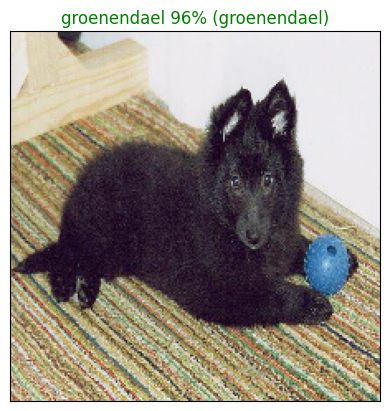

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

now we have got one function to visualize our model's top predictions, let's make another to view our model's top 10 predictions.

The function will:
1. Take an input of prediction probablities array and a ground truth array and an integer
2. Find the predicted label using `get_pred_label()`
3. Find the top 10:
  *   Prediction probabilites indexes
  *   Prediction probabilities values
  *   Prediction Labels
  *   Plot the top 10 prediction probabilities values and labels
  * Coloring the true label `green`






In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

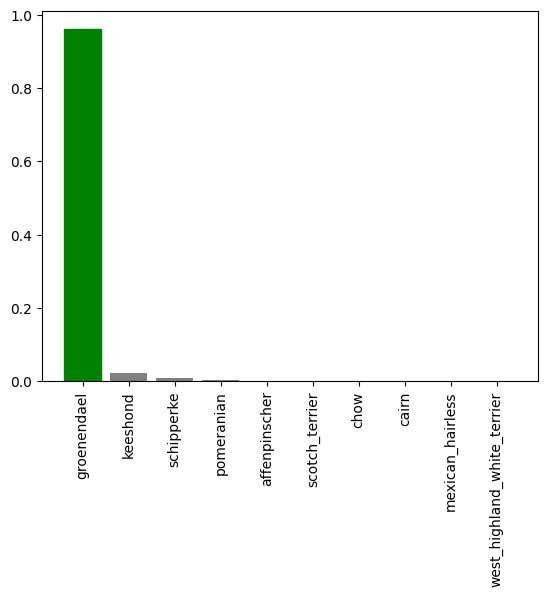

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=77)

Now we have got some functions to help us visualize our predictions and evaluate our model.

let's check out a few

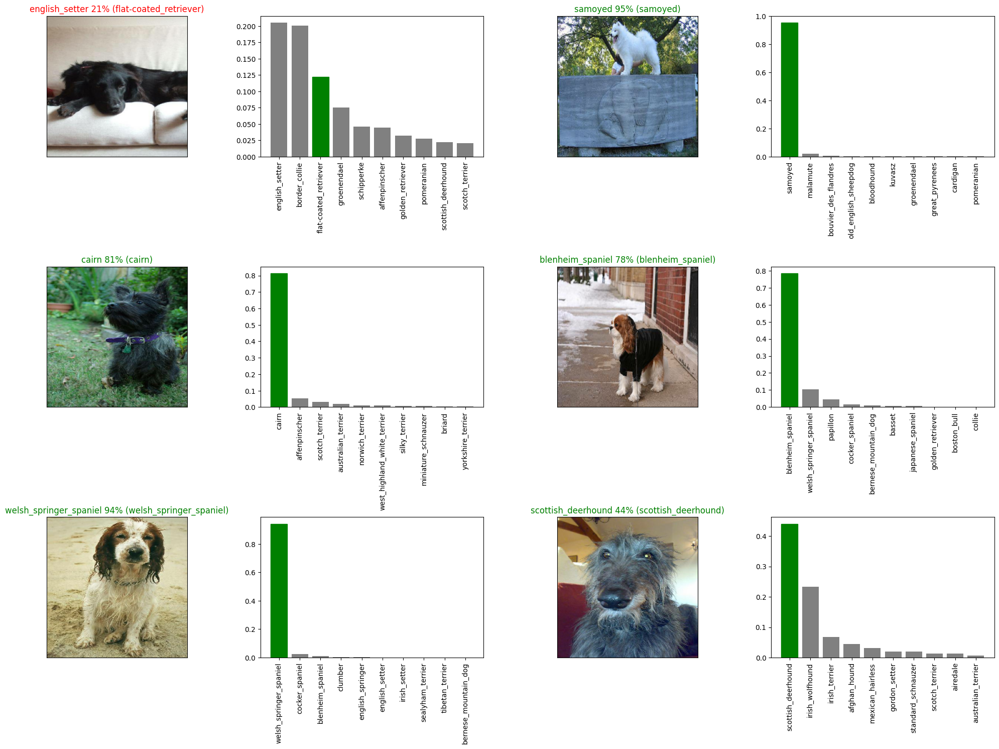

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Loading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab projects/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path
  # if suffix:
  #   modeldir += "_" + suffix
  # modeldir += ".h5" # save format of model
  # print(f"Saving model to: {modeldir}")
  # model.save(modeldir)
  # return modeldir

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we have got functions to save and load a trained model, let's test it.

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Colab projects/Dog Vision/models/20240918-02251726626323-1000-images-mobilenetV2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab projects/Dog Vision/models/20240918-02251726626323-1000-images-mobilenetV2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Colab projects/Dog Vision/models/20240917-20431726605780-1000-images-mobilenetV2-Adam.h5')

Loading saved model from: drive/MyDrive/Colab projects/Dog Vision/models/20240917-20431726605780-1000-images-mobilenetV2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2289 - accuracy: 0.6650


[1.228947401046753, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 1.2949 - accuracy: 0.6850


[1.2949200868606567, 0.6850000023841858]

## Training a big dog model (On a full data)

In [ ]:
len(X), len(y)

(7890, 7890)

In [ ]:
X[:10]

['drive/MyDrive/Colab projects/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for a full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


In [ ]:
# Create full model callback
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take more time (more on the 1st epoch)!

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
247/247 [==============================] - 553s 2s/step - loss: 0.0086 - accuracy: 0.9990
Epoch 2/100
247/247 [==============================] - 510s 2s/step - loss: 0.0070 - accuracy: 0.9995
Epoch 3/100
247/247 [==============================] - 524s 2s/step - loss: 0.0090 - accuracy: 0.9991
Epoch 4/100
247/247 [==============================] - 523s 2s/step - loss: 0.0077 - accuracy: 0.9990
Epoch 5/100
247/247 [==============================] - 518s 2s/step - loss: 0.0067 - accuracy: 0.9994


In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab projects/Dog Vision/models/20240918-06241726640667-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab projects/Dog Vision/models/20240918-06241726640667-full-image-set-mobilenetv2-Adam.h5'

In [109]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Colab projects/Dog Vision/models/20240918-06241726640667-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Colab projects/Dog Vision/models/20240918-06241726640667-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test data


Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

1. Get the test image filenames.
2. Convert the filenames into test data batches using `create_data_batches()` and
setting the test_data parameter to True (since there are no labels with the test images).
3. Make a predictions array by passing the test data batches to the `predict()` function.

In [ ]:
# Load the test path
test_path = "drive/MyDrive/Colab projects/Dog Vision/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab projects/Dog Vision/teste288dace85bb7ae95b545066bcbdee60.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/teste1d31decdd6521df89e59d181f0c73ed.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/testdef639bab46dfc714234180be730ef49.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/teste427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/teste5a78d4d53fc5957cc9dedd318139d3d.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/teste85b19a69be67eaef9fe58b7e689ee81.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/tested6d16749ad7dbed282857c6c0cb0b64.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/testf574f558d78db4e616e91f5dd5347409.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/testf43a0698255ee6f04ad91702a4376b6c.jpg',
 'drive/MyDrive/Colab projects/Dog Vision/testf495e4dbc5b2bc6230bca03970d37876.jpg']

In [ ]:
import random
import os

# Define the test path
test_path = "drive/MyDrive/Colab projects/Dog Vision/test"

# Get all test filenames
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]

# Shuffle the list to randomly select test images
random.shuffle(test_filenames)

# Select only 7890 test images
selected_test_filenames = test_filenames[:7890]

# Optionally: Save the selected test filenames to a new list or directory
with open("drive/MyDrive/Colab projects/Dog Vision/selected_test_filenames.txt", "w") as f:
    for filename in selected_test_filenames:
        f.write(f"{filename}\n")

# Print out the first 10 selected test filenames
print("First 10 selected test filenames:")
print(selected_test_filenames[:10])

# Now you can use 'selected_test_filenames' for testing, which contains the same number of images as your training set.


First 10 selected test filenames:
['drive/MyDrive/Colab projects/Dog Vision/test/332eff8d1e8f55a0e7335a1552f681ef.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/b38611a8637d828eb0b47cd082471da8.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/75eecda230acacf497634f3550ae322e.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/dde1bc55cec2ac068cb9822928e67461.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/b77dbd50464ea6f854fc74754407b9be.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/a8f3055821c65b70e67911cc5bad1270.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/57561c9498cf19caed3e4b2b04367116.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/27cc404e7a759adb17bafce33a5ddcd6.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/505f53fe9f598b73849518324e3d5daa.jpg', 'drive/MyDrive/Colab projects/Dog Vision/test/522b3f3f94bb5deebebe2c43fb2e70c2.jpg']


In [ ]:
len(selected_test_filenames)

7890

In [ ]:
# Create test data batch
test_data = create_data_batches(selected_test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_model.predict(test_data, verbose=1)

247/247 [==============================] - 836s 3s/step


In [ ]:
# Save predictions (numpy array) to csv file (to access later)
np.savetxt("drive/MyDrive/Colab projects/Dog Vision/preds_array.csv",
           test_predictions,
           delimiter=",")

In [ ]:
# Load the predictions from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab projects/Dog Vision/preds_array.csv",
                              delimiter=",")

In [ ]:
test_predictions.shape

(7890, 120)

## Making Predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since
our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.


In [144]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Colab projects/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path) if not fname.startswith('.') and
                      os.path.isfile(os.path.join(custom_path, fname))] # Exclude hidden files and directories

In [145]:
custom_image_paths

['drive/MyDrive/Colab projects/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 'drive/MyDrive/Colab projects/Dog Vision/my-dog-photos/dog-photo-3.jpeg',
 'drive/MyDrive/Colab projects/Dog Vision/my-dog-photos/dog-photo-1.jpeg']

In [146]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [147]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 238ms/step


In [148]:
custom_preds.shape

(3, 120)

In [149]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'labrador_retriever', 'labrador_retriever']

In [150]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

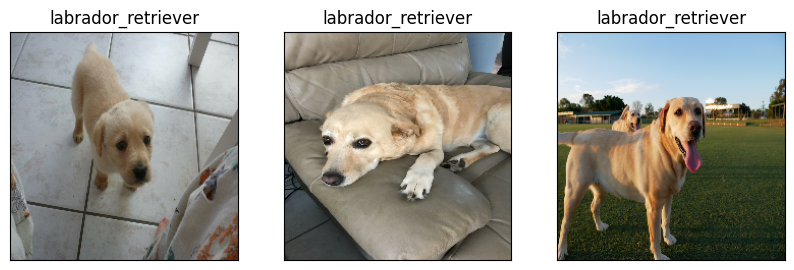

In [151]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)